<center>
##IFT 6135 : Representation Learning 
##Winter 2018
  
# ASSIGNMENT - 3 : PROGRAMMING PART
# Problem 3 - VAE


Submitted by 

___________________________________________________



## PRAVISH SAINATH
####20125633
####M.Sc. Informatique
####Université de Montréal


Recent years have shown an explosion of research into using deep learning and computer vision algorithms to generate images.

An ongoing challenge in the image generation community is the question of evaluation.
In computer science we often want objective metrics by which to compare our algorithms, but for aesthetic tasks it is not obvious that such a metric even exists.
Thus, assessing the quality of a generative model often involves a combination of qualitative and quantitative evaluations, and evaluation of generative models is an active area of research. 

In this final question, we investigate the advantages and disadvantages of two popular generative models in deep learning: GANs and VAEs, using some popular evaluation methods from the literature.

In [0]:
import torch

import torchvision
from torchvision import transforms, utils, datasets

from torch.utils.data import dataset

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data.sampler import SubsetRandomSampler
from torch.autograd import Variable

# Numpy and matplotlib

from torch import autograd

import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt

import pandas as pd

import random
from tqdm import tqdm_notebook

import os
import os.path
from os import makedirs
from os.path import join, exists

import shutil
from google.colab import files

## Data Loading

<br/>
$\textbf{Street View House Numbers (SVHN)}$

The SVHN dataset is made up of clipped images of house numbers from Google Street View.
Like MNIST, the goal is to classify digits (0-9), but it is a larger dataset, with color images. 


The data is available here: 
* http://ufldl.stanford.edu/housenumbers/train_32x32.mat (train set) 
* http://ufldl.stanford.edu/housenumbers/test_32x32.mat (test set)

Perform your own split on the training set for a validation set.

Alternatively, you may use the download, split, and iterator code provided with this assignment.

In [0]:
def get_data_loader(dataset_location = 'data', batch_size = 64):
  
    image_transform = transforms.Compose([
      transforms.ToTensor(),
      transforms.Normalize((0.5, 0.5, 0.5),(0.5, 0.5, 0.5))
    ])
  
    trainvalid = torchvision.datasets.SVHN(
        dataset_location, split='train',
        download=True,
        transform=image_transform
    )

    trainset_size = int(len(trainvalid) * 0.9)
    trainset, validset = dataset.random_split(
        trainvalid,
        [trainset_size, len(trainvalid) - trainset_size]
    )

    trainloader = torch.utils.data.DataLoader(
        trainset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=2
    )

    validloader = torch.utils.data.DataLoader(
        validset,
        batch_size=batch_size,
    )

    testloader = torch.utils.data.DataLoader(
        torchvision.datasets.SVHN(
            dataset_location, split='test',
            download=True,
            transform=image_transform
        ),
        batch_size=batch_size,
    )

    return trainloader, validloader, testloader

In [0]:
train_loader, validation_loader, test_loader = get_data_loader()

Using downloaded and verified file: data/train_32x32.mat
Using downloaded and verified file: data/test_32x32.mat


In [0]:
def print_data_description(loader,dataset_type):
  print('{} data : {} batches = {} samples'.format(dataset_type,len(loader),len(loader.dataset)))
  

for loader,dataset_type in zip([train_loader, validation_loader, test_loader],['train','validation','test']):  
  print_data_description(loader,dataset_type)  

train data : 1031 batches = 65931 samples
validation data : 115 batches = 7326 samples
test data : 407 batches = 26032 samples


$\textbf{Generative models}$
<br/>
For the assignment, you will have to implement **both** of the following models: 

* $\underline{Variational \; Auto-Encoders \; (VAE) \; :}$
<br/>
Consists of an encoder, $f(x)$, and a decoder $g_\textrm{VAE}(z)$ that returns the mean of the Gaussian likelihood function $p(x|z)=\textit{N}(x;g_\textrm{VAE}(z), \mathbf{I})$.

* $\underline{Generative \; Adversarial \;Networks (GANs):}$
<br/>
Consists of a generator $g_\textrm{GAN}(z)$, and a discriminator $d(x)$.


Note that both models have a $g(z)$, which takes a sample from the prior distribution (in this case the standard Gaussian, $N(\mathbf{0}, \mathbf{I})$, and produces an image.
This is primarily what the qualitative evaluations will be centred around.

<br/>

$\textbf{Hyperparameters & Training Pointers}$
<br/>
Train both models with a latent variable dimension of 100.
Both models have a generator that takes in a latent code and produces an image, so use the same architecture in both cases.

Beyond those restrictions, you are free to experiment with different architectures and to use one that works.
One way to verify that it does is to look at samples from $g(z)$.

<br/>
The following are some pointers to deal with the training of these models:
* For GANS, use the WGAN-GP objective with gradient penalty. you might need to tune the number of times you update the parameters of the discriminator before updating the generator once.

* For VAEs, be careful with the activation you choose to ensure the standard deviation is positive (exponentiation works but might not be optimal for stability).

* Most importantly, there are some metrics that you can monitor throughout training, such as the discriminator's cross entropy loss for GAN and the KL divergence between the prior and approximate posterior for VAE.
Make good use of these metrics!



In [0]:
BATCH_SIZE = 64
LATENT_DIMENSION = 100

NUM_CHANNELS = 3
IMAGE_DIMENSION = 32

In [0]:
def check_shape(tensor, shape, name):
  
  expected_shape = torch.Size(shape)
  
  print(name + " shape = ", tensor.shape)
  assert tensor.shape == expected_shape

  
  
def test_model(model, input_shape, output_shape, name = "Output", print_model = False):
  model = model.cuda()
  
  if(print_model):
    print(model)
  
  input_tensor = torch.randn(input_shape)
  input_tensor = input_tensor.cuda() 
 
  output_tensor = model(input_tensor)
  
  check_shape(output_tensor, output_shape, name)

In [0]:
def weights_init(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

In [0]:
class Generator(nn.Module):
  
    def __init__(self, latent_dimension = LATENT_DIMENSION):
        super(Generator, self).__init__()
                
        self.nz = latent_dimension
        
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(self.nz, 512, kernel_size = 4, stride = 1, padding = 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d( 512, 256, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d( 256, 128, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d( 128, 3, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        
        # Check for latent dimension match
        assert z.size(-1) == self.nz
        
        # Unflatten latent vector(s)  
        z = z.view(z.size(0), -1, 1, 1)
        
        # Pass through Deconvolution network
        x = self.deconv(z)     

        # Return generated sample
        return x

In [0]:
test_model(Generator(), (BATCH_SIZE, LATENT_DIMENSION), (BATCH_SIZE, NUM_CHANNELS, IMAGE_DIMENSION, IMAGE_DIMENSION), print_model = True)

Generator(
  (deconv): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)
Output shape =  torch.Size([64, 3, 32, 32])


In [0]:
class Encoder(nn.Module):

    def __init__(self, latent_dimension = LATENT_DIMENSION):
      
        super(Encoder, self).__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
            )
        
        self.mean = nn.Linear(512*4*4, latent_dimension)
        
        self.logvar = nn.Linear(512*4*4, latent_dimension)


    def forward(self, x):
      
        # Pass through Convolutional network
        x = self.conv(x)
        
        # Flatten 
        x = x.view(-1, 512*4*4)
        
        # Pass through mean and logvar linear networks
        mean = self.mean(x)
        logvar = self.logvar(x)
        
        return mean, logvar

In [0]:
def test_encoder(encoder, input_shape, output_shape, print_model = False):

  model = encoder.cuda()
  
  if(print_model):
    print(model)
  
  input_tensor = torch.randn(input_shape)
  input_tensor = input_tensor.cuda() 
 
  mean, logvar = model(input_tensor)

  check_shape(mean, output_shape, "Mean output") 
  check_shape(logvar, output_shape, "Logvar output") 

In [0]:
test_encoder(Encoder(), (BATCH_SIZE, NUM_CHANNELS, IMAGE_DIMENSION, IMAGE_DIMENSION), (BATCH_SIZE, LATENT_DIMENSION), print_model = True)

Encoder(
  (conv): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
  )
  (mean): Linear(in_features=8192, out_features=100, bias=True)
  (logvar): Linear(in_features=8192, out_features=100, bias=True)
)
Mean output shape =  torch.Size([64, 100])
Logvar output shape =  torch.Size([64, 100])


In [0]:
class VAE(nn.Module):
    
    def __init__(self,latent_dimension = LATENT_DIMENSION):
        super(VAE, self).__init__()

        self.encoder = Encoder(latent_dimension) 
        self.decoder = Generator(latent_dimension) 
        
    def reparameterize(self, mean, logvar):
      
      std = torch.exp(logvar/2)
      noise = torch.randn_like(mean)
      
      z = mean + noise * std
      
      return z

    
    def forward(self, x):
      
        mean, logvar = self.encoder(x)
        
        z = self.reparameterize(mean, logvar)
        
        x_reconstructed = self.decoder(z)
        
        return x_reconstructed, (mean, logvar)

      
    def sample(self, z):
        return self.decoder(z)

In [0]:
def test_VAE(batch_size = BATCH_SIZE, image_dimension = IMAGE_DIMENSION, latent_dimension = LATENT_DIMENSION, num_channels = NUM_CHANNELS):

  image_shape = (batch_size, num_channels, image_dimension, image_dimension)
  
  latent_shape = (batch_size, latent_dimension)
  
  model = VAE().cuda()
    
  print("Testing VAE \n")
  
  print("Batch size   = ",batch_size)
  
  print("\n")
  
  print("Image shape  = ",image_shape)
  print("Latent shape = ",latent_shape)
  
  print("\n")
  
  input_tensor = torch.randn(image_shape).cuda() 
 
  output_tensor, (mean, logvar) = model(input_tensor)
  
  check_shape(mean, latent_shape, "Mean output") 
  check_shape(logvar, latent_shape, "Logvar output") 
  
  check_shape(output_tensor, image_shape, "Decoder output")  

In [0]:
test_VAE()

Testing VAE 

Batch size   =  64


Image shape  =  (64, 3, 32, 32)
Latent shape =  (64, 100)


Mean output shape =  torch.Size([64, 100])
Logvar output shape =  torch.Size([64, 100])
Decoder output shape =  torch.Size([64, 3, 32, 32])


## Loss Functions

In [0]:
def reconstruction_loss(x_reconstructed, x):
  return F.mse_loss(x_reconstructed, x, reduction='sum')

def kl_divergence(mean, logvar):
  return 0.5 * torch.sum(mean**2 + logvar.exp() - 1 - logvar)

## Utils

In [0]:
RESULTS_LOCATION = 'results'
DATASET_LOCATION = 'data'
SAMPLES_LOCATION = 'samples'

In [0]:
class StatusPrinter:
  
  def __init__(self, start_epoch, num_epochs, experiment_name, batch_size, learning_rate):
    self.num_epochs = num_epochs
    self.start_epoch = start_epoch
    self.epoch = start_epoch
    
    self.experiment_name = experiment_name
    self.batch_size = batch_size
    
    self.learning_rate = learning_rate
    
    
  def experiment_started(self):  
    print("\n Starting VAE Experiment : ", self.experiment_name)
    print("------------------------------------------")
  
 
  def dataset_loaded(self):
    print("\n Loaded SVHN Dataset, batch size = ", self.batch_size)

  
  def epochs_starting(self):
    print("\n Experiment running from {} to {} epochs with learning_rate = {} ".format(self.start_epoch, self.num_epochs, self.learning_rate))
    print("----------------------------------------------------------------------------------------------------------------------\n")
  
  def epoch_header(self):
    print("Epoch [{}/{}]".format(self.epoch, self.num_epochs))
    self.epoch += 1

    
  def stats(self, stats_train, stats_val):
    print("  Training Stats :   Total loss = %.5f    [ Reconstruction loss = %.5f | KL  = %.5f]" % (stats_train['total_loss'], stats_train['reconstruction_loss'], stats_train['kl_divergence']))
    print("Validation Stats :   Total loss = %.5f    [ Reconstruction loss = %.5f | KL  = %.5f]" % (stats_val['total_loss'], stats_val['reconstruction_loss'], stats_val['kl_divergence']))
    print("----------------------------------------------------------------------------------------------------------------------\n")


In [0]:
class ResultsFileHelper:
    
  def __init__(self, results_location, experiment_name):
    experiment_directory = join(results_location, experiment_name)
    
    if not exists(experiment_directory):
      makedirs(experiment_directory)
    
    self.root = experiment_directory
    self.name = experiment_name
    
  def extract_values(field, array):    
    np_array = np.array([item[field] for item in array])
    return np_array
  
  def save_csv(self, array, filename):
    df = pd.DataFrame.from_dict(array)
    df.to_csv (join(self.root, r'%s.csv' % filename), index = None, header=True)
  
  def save_results(self, model, training_stats, validation_stats):
    
    torch.save(model.state_dict(), join(self.root, 'vae-{}.pt'.format(self.name)))
    self.save_csv(training_stats, 'training_stats')
    self.save_csv(validation_stats, 'validation_stats') 
    
  def download_results(results_location = RESULTS_LOCATION, file_name = 'results'):
    shutil.make_archive(file_name, 'zip', results_location)
    files.download(file_name+'.zip') 
    

In [0]:
def run_epoch(model, data_loader, epoch, training = False, optimizer = None):

  assert training or optimizer==None   
  
  stat = {
      'epoch': epoch,
      'total_loss':0.0,
      'reconstruction_loss':0.0,
      'kl_divergence':0.0
  }

  data_stream = tqdm_notebook(data_loader)
  
  for index, (x,_) in enumerate(data_stream):
    
    if training:
      optimizer.zero_grad()
      data_stream.set_description("Training ")
    else:
      data_stream.set_description("Validation ")
      
    x = x.cuda()
    model = model.cuda()

    x_reconstructed, (mean, logvar) = model(x)

    loss_reconstruction = reconstruction_loss(x_reconstructed, x)
    kl_value = kl_divergence(mean, logvar)
    
    stat['reconstruction_loss'] += loss_reconstruction.data.item()  
    stat['kl_divergence'] += kl_value.data.item()  
    
    total_loss = loss_reconstruction + kl_value

    stat['total_loss'] += total_loss.data.item() 
            
    if training:
      total_loss.backward()
      optimizer.step()
  
  num_samples = len(data_loader.dataset)
  
  stat['total_loss'] /= num_samples  
  stat['reconstruction_loss'] /= num_samples  
  stat['kl_divergence'] /= num_samples  

  return stat

In [0]:

def run_experiment(experiment_name,
                   model = VAE(),
                   num_epochs = 50,
                   start_epoch = 1,
                   learning_rate = 5e-4,
                   beta1 = 0.5,
                   beta2 = 0.999,
                   batch_size = BATCH_SIZE,
                   dataset_location = DATASET_LOCATION,
                   results_location = RESULTS_LOCATION,
                   save_frequency = 5                        
                  ):

  printer = StatusPrinter(start_epoch, num_epochs, experiment_name, batch_size, learning_rate)
  file_helper = ResultsFileHelper(results_location, experiment_name)
  
  printer.experiment_started()
  
  # Load Dataset
  training_loader, validation_loader, test_loader = get_data_loader(dataset_location, batch_size)

  printer.dataset_loaded()

  # Optimizer setup
  optimizer = optim.Adam(model.parameters(), lr = learning_rate, betas = (beta1, beta2))
    
  printer.epochs_starting()
  
  training_stats = []
  validation_stats = []
  
  for epoch in range(start_epoch, num_epochs+1):
                   
        printer.epoch_header()
        
        # Training set
        model.train()
        stats_train = run_epoch(model, training_loader, epoch, True, optimizer)
        training_stats.append(stats_train)
                    
        # Validation set        
        model.eval()
        with torch.no_grad():
          stats_val = run_epoch(model, validation_loader, epoch)
          validation_stats.append(stats_val)
                    
        printer.stats(stats_train, stats_val)  
                
        if epoch % save_frequency == 0 or epoch == num_epochs:
          file_helper.save_results(model, training_stats, validation_stats)
          

In [0]:
use_cuda = torch.cuda.is_available()

assert use_cuda

In [0]:
seed = 20125633

np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

In [0]:
model = VAE()
model.apply(weights_init)
run_experiment('final', model)


 Starting VAE Experiment :  final
------------------------------------------
Using downloaded and verified file: data/train_32x32.mat
Using downloaded and verified file: data/test_32x32.mat

 Loaded SVHN Dataset, batch size =  64

 Experiment running from 1 to 50 epochs with learning_rate = 0.0005 
----------------------------------------------------------------------------------------------------------------------

Epoch [1/50]



  Training Stats :   Total loss = 139.45742    [ Reconstruction loss = 108.65978 | KL  = 30.79763]
Validation Stats :   Total loss = 104.36908    [ Reconstruction loss = 72.09668 | KL  = 32.27240]
----------------------------------------------------------------------------------------------------------------------

Epoch [2/50]



  Training Stats :   Total loss = 102.90389    [ Reconstruction loss = 71.35902 | KL  = 31.54487]
Validation Stats :   Total loss = 97.07387    [ Reconstruction loss = 62.75426 | KL  = 34.31961]
----------------------------------------------------------------------------------------------------------------------

Epoch [3/50]



  Training Stats :   Total loss = 98.36368    [ Reconstruction loss = 65.71711 | KL  = 32.64657]
Validation Stats :   Total loss = 93.19168    [ Reconstruction loss = 58.33236 | KL  = 34.85932]
----------------------------------------------------------------------------------------------------------------------

Epoch [4/50]



  Training Stats :   Total loss = 93.63361    [ Reconstruction loss = 60.47663 | KL  = 33.15698]
Validation Stats :   Total loss = 91.40127    [ Reconstruction loss = 58.73948 | KL  = 32.66179]
----------------------------------------------------------------------------------------------------------------------

Epoch [5/50]



  Training Stats :   Total loss = 90.39529    [ Reconstruction loss = 56.98933 | KL  = 33.40596]
Validation Stats :   Total loss = 86.72763    [ Reconstruction loss = 53.43485 | KL  = 33.29278]
----------------------------------------------------------------------------------------------------------------------

Epoch [6/50]



  Training Stats :   Total loss = 88.23511    [ Reconstruction loss = 54.88409 | KL  = 33.35102]
Validation Stats :   Total loss = 86.46201    [ Reconstruction loss = 53.43441 | KL  = 33.02760]
----------------------------------------------------------------------------------------------------------------------

Epoch [7/50]



  Training Stats :   Total loss = 86.25100    [ Reconstruction loss = 52.96316 | KL  = 33.28785]
Validation Stats :   Total loss = 84.92255    [ Reconstruction loss = 50.99208 | KL  = 33.93047]
----------------------------------------------------------------------------------------------------------------------

Epoch [8/50]



  Training Stats :   Total loss = 84.86826    [ Reconstruction loss = 51.61734 | KL  = 33.25092]
Validation Stats :   Total loss = 82.64422    [ Reconstruction loss = 49.18683 | KL  = 33.45739]
----------------------------------------------------------------------------------------------------------------------

Epoch [9/50]



  Training Stats :   Total loss = 83.71960    [ Reconstruction loss = 50.50127 | KL  = 33.21832]
Validation Stats :   Total loss = 83.03380    [ Reconstruction loss = 49.95474 | KL  = 33.07906]
----------------------------------------------------------------------------------------------------------------------

Epoch [10/50]



  Training Stats :   Total loss = 82.88429    [ Reconstruction loss = 49.62600 | KL  = 33.25829]
Validation Stats :   Total loss = 81.63153    [ Reconstruction loss = 49.37791 | KL  = 32.25362]
----------------------------------------------------------------------------------------------------------------------

Epoch [11/50]



  Training Stats :   Total loss = 82.06518    [ Reconstruction loss = 48.78542 | KL  = 33.27976]
Validation Stats :   Total loss = 85.06517    [ Reconstruction loss = 52.41386 | KL  = 32.65132]
----------------------------------------------------------------------------------------------------------------------

Epoch [12/50]



  Training Stats :   Total loss = 81.43610    [ Reconstruction loss = 48.20136 | KL  = 33.23474]
Validation Stats :   Total loss = 82.57530    [ Reconstruction loss = 49.73741 | KL  = 32.83789]
----------------------------------------------------------------------------------------------------------------------

Epoch [13/50]



  Training Stats :   Total loss = 80.82952    [ Reconstruction loss = 47.62197 | KL  = 33.20755]
Validation Stats :   Total loss = 81.01981    [ Reconstruction loss = 47.47658 | KL  = 33.54323]
----------------------------------------------------------------------------------------------------------------------

Epoch [14/50]



  Training Stats :   Total loss = 80.30445    [ Reconstruction loss = 47.11806 | KL  = 33.18639]
Validation Stats :   Total loss = 81.72736    [ Reconstruction loss = 47.10639 | KL  = 34.62097]
----------------------------------------------------------------------------------------------------------------------

Epoch [15/50]



  Training Stats :   Total loss = 79.81134    [ Reconstruction loss = 46.63643 | KL  = 33.17491]
Validation Stats :   Total loss = 79.34777    [ Reconstruction loss = 45.80587 | KL  = 33.54189]
----------------------------------------------------------------------------------------------------------------------

Epoch [16/50]



  Training Stats :   Total loss = 79.52075    [ Reconstruction loss = 46.36274 | KL  = 33.15801]
Validation Stats :   Total loss = 79.11222    [ Reconstruction loss = 46.52202 | KL  = 32.59020]
----------------------------------------------------------------------------------------------------------------------

Epoch [17/50]



  Training Stats :   Total loss = 79.04837    [ Reconstruction loss = 45.90418 | KL  = 33.14419]
Validation Stats :   Total loss = 78.96600    [ Reconstruction loss = 46.50375 | KL  = 32.46225]
----------------------------------------------------------------------------------------------------------------------

Epoch [18/50]



  Training Stats :   Total loss = 78.74762    [ Reconstruction loss = 45.61369 | KL  = 33.13394]
Validation Stats :   Total loss = 79.02326    [ Reconstruction loss = 45.28804 | KL  = 33.73521]
----------------------------------------------------------------------------------------------------------------------

Epoch [19/50]



  Training Stats :   Total loss = 78.21773    [ Reconstruction loss = 45.13434 | KL  = 33.08339]
Validation Stats :   Total loss = 78.97337    [ Reconstruction loss = 46.03936 | KL  = 32.93401]
----------------------------------------------------------------------------------------------------------------------

Epoch [20/50]



  Training Stats :   Total loss = 78.13913    [ Reconstruction loss = 45.04962 | KL  = 33.08951]
Validation Stats :   Total loss = 78.94251    [ Reconstruction loss = 45.76414 | KL  = 33.17837]
----------------------------------------------------------------------------------------------------------------------

Epoch [21/50]



  Training Stats :   Total loss = 77.90118    [ Reconstruction loss = 44.79242 | KL  = 33.10877]
Validation Stats :   Total loss = 78.45925    [ Reconstruction loss = 44.97541 | KL  = 33.48384]
----------------------------------------------------------------------------------------------------------------------

Epoch [22/50]



  Training Stats :   Total loss = 77.53102    [ Reconstruction loss = 44.47836 | KL  = 33.05265]
Validation Stats :   Total loss = 78.45366    [ Reconstruction loss = 45.19380 | KL  = 33.25986]
----------------------------------------------------------------------------------------------------------------------

Epoch [23/50]



  Training Stats :   Total loss = 77.25545    [ Reconstruction loss = 44.20325 | KL  = 33.05220]
Validation Stats :   Total loss = 79.42976    [ Reconstruction loss = 46.13140 | KL  = 33.29835]
----------------------------------------------------------------------------------------------------------------------

Epoch [24/50]



  Training Stats :   Total loss = 76.98754    [ Reconstruction loss = 43.94782 | KL  = 33.03972]
Validation Stats :   Total loss = 77.77721    [ Reconstruction loss = 44.74159 | KL  = 33.03562]
----------------------------------------------------------------------------------------------------------------------

Epoch [25/50]



  Training Stats :   Total loss = 76.88933    [ Reconstruction loss = 43.86914 | KL  = 33.02019]
Validation Stats :   Total loss = 78.35969    [ Reconstruction loss = 44.48827 | KL  = 33.87142]
----------------------------------------------------------------------------------------------------------------------

Epoch [26/50]



  Training Stats :   Total loss = 76.57228    [ Reconstruction loss = 43.55938 | KL  = 33.01290]
Validation Stats :   Total loss = 77.28082    [ Reconstruction loss = 44.49186 | KL  = 32.78896]
----------------------------------------------------------------------------------------------------------------------

Epoch [27/50]



  Training Stats :   Total loss = 76.52252    [ Reconstruction loss = 43.50686 | KL  = 33.01566]
Validation Stats :   Total loss = 77.39314    [ Reconstruction loss = 44.47198 | KL  = 32.92115]
----------------------------------------------------------------------------------------------------------------------

Epoch [28/50]



  Training Stats :   Total loss = 76.26446    [ Reconstruction loss = 43.25753 | KL  = 33.00694]
Validation Stats :   Total loss = 77.76267    [ Reconstruction loss = 44.86849 | KL  = 32.89418]
----------------------------------------------------------------------------------------------------------------------

Epoch [29/50]



  Training Stats :   Total loss = 76.00058    [ Reconstruction loss = 43.02567 | KL  = 32.97492]
Validation Stats :   Total loss = 77.27685    [ Reconstruction loss = 44.68533 | KL  = 32.59152]
----------------------------------------------------------------------------------------------------------------------

Epoch [30/50]



  Training Stats :   Total loss = 75.86725    [ Reconstruction loss = 42.89224 | KL  = 32.97501]
Validation Stats :   Total loss = 79.90798    [ Reconstruction loss = 47.02670 | KL  = 32.88128]
----------------------------------------------------------------------------------------------------------------------

Epoch [31/50]



  Training Stats :   Total loss = 75.80806    [ Reconstruction loss = 42.79941 | KL  = 33.00865]
Validation Stats :   Total loss = 77.50666    [ Reconstruction loss = 44.31579 | KL  = 33.19086]
----------------------------------------------------------------------------------------------------------------------

Epoch [32/50]



  Training Stats :   Total loss = 75.47488    [ Reconstruction loss = 42.57143 | KL  = 32.90345]
Validation Stats :   Total loss = 77.87683    [ Reconstruction loss = 44.64781 | KL  = 33.22902]
----------------------------------------------------------------------------------------------------------------------

Epoch [33/50]



  Training Stats :   Total loss = 75.47917    [ Reconstruction loss = 42.51621 | KL  = 32.96295]
Validation Stats :   Total loss = 77.16658    [ Reconstruction loss = 44.68578 | KL  = 32.48081]
----------------------------------------------------------------------------------------------------------------------

Epoch [34/50]



  Training Stats :   Total loss = 75.28618    [ Reconstruction loss = 42.31654 | KL  = 32.96964]
Validation Stats :   Total loss = 78.46159    [ Reconstruction loss = 45.13509 | KL  = 33.32650]
----------------------------------------------------------------------------------------------------------------------

Epoch [35/50]



  Training Stats :   Total loss = 75.12053    [ Reconstruction loss = 42.20680 | KL  = 32.91374]
Validation Stats :   Total loss = 77.30568    [ Reconstruction loss = 44.93421 | KL  = 32.37146]
----------------------------------------------------------------------------------------------------------------------

Epoch [36/50]



  Training Stats :   Total loss = 74.99902    [ Reconstruction loss = 42.05709 | KL  = 32.94193]
Validation Stats :   Total loss = 79.13234    [ Reconstruction loss = 45.88016 | KL  = 33.25217]
----------------------------------------------------------------------------------------------------------------------

Epoch [37/50]



  Training Stats :   Total loss = 74.81427    [ Reconstruction loss = 41.91424 | KL  = 32.90003]
Validation Stats :   Total loss = 78.29179    [ Reconstruction loss = 44.74796 | KL  = 33.54383]
----------------------------------------------------------------------------------------------------------------------

Epoch [38/50]



  Training Stats :   Total loss = 74.65056    [ Reconstruction loss = 41.76781 | KL  = 32.88275]
Validation Stats :   Total loss = 76.86452    [ Reconstruction loss = 43.69262 | KL  = 33.17190]
----------------------------------------------------------------------------------------------------------------------

Epoch [39/50]



  Training Stats :   Total loss = 74.48976    [ Reconstruction loss = 41.62523 | KL  = 32.86453]
Validation Stats :   Total loss = 76.87947    [ Reconstruction loss = 44.44324 | KL  = 32.43622]
----------------------------------------------------------------------------------------------------------------------

Epoch [40/50]



  Training Stats :   Total loss = 74.49891    [ Reconstruction loss = 41.61865 | KL  = 32.88026]
Validation Stats :   Total loss = 79.66568    [ Reconstruction loss = 47.51003 | KL  = 32.15566]
----------------------------------------------------------------------------------------------------------------------

Epoch [41/50]



  Training Stats :   Total loss = 74.36565    [ Reconstruction loss = 41.50136 | KL  = 32.86430]
Validation Stats :   Total loss = 77.36963    [ Reconstruction loss = 44.35462 | KL  = 33.01501]
----------------------------------------------------------------------------------------------------------------------

Epoch [42/50]



  Training Stats :   Total loss = 74.18993    [ Reconstruction loss = 41.32068 | KL  = 32.86925]
Validation Stats :   Total loss = 77.22264    [ Reconstruction loss = 44.61373 | KL  = 32.60891]
----------------------------------------------------------------------------------------------------------------------

Epoch [43/50]



  Training Stats :   Total loss = 74.04699    [ Reconstruction loss = 41.18675 | KL  = 32.86024]
Validation Stats :   Total loss = 76.66978    [ Reconstruction loss = 44.02656 | KL  = 32.64322]
----------------------------------------------------------------------------------------------------------------------

Epoch [44/50]



  Training Stats :   Total loss = 73.96378    [ Reconstruction loss = 41.14066 | KL  = 32.82312]
Validation Stats :   Total loss = 76.30892    [ Reconstruction loss = 43.82710 | KL  = 32.48183]
----------------------------------------------------------------------------------------------------------------------

Epoch [45/50]



  Training Stats :   Total loss = 73.87559    [ Reconstruction loss = 41.03939 | KL  = 32.83620]
Validation Stats :   Total loss = 76.53143    [ Reconstruction loss = 44.01407 | KL  = 32.51736]
----------------------------------------------------------------------------------------------------------------------

Epoch [46/50]



  Training Stats :   Total loss = 73.73093    [ Reconstruction loss = 40.87217 | KL  = 32.85876]
Validation Stats :   Total loss = 78.17172    [ Reconstruction loss = 45.06832 | KL  = 33.10340]
----------------------------------------------------------------------------------------------------------------------

Epoch [47/50]



  Training Stats :   Total loss = 73.72980    [ Reconstruction loss = 40.89987 | KL  = 32.82993]
Validation Stats :   Total loss = 76.55708    [ Reconstruction loss = 43.72859 | KL  = 32.82849]
----------------------------------------------------------------------------------------------------------------------

Epoch [48/50]



  Training Stats :   Total loss = 73.56925    [ Reconstruction loss = 40.77067 | KL  = 32.79858]
Validation Stats :   Total loss = 77.40525    [ Reconstruction loss = 44.92859 | KL  = 32.47666]
----------------------------------------------------------------------------------------------------------------------

Epoch [49/50]



  Training Stats :   Total loss = 73.43565    [ Reconstruction loss = 40.62628 | KL  = 32.80937]
Validation Stats :   Total loss = 76.51294    [ Reconstruction loss = 43.29913 | KL  = 33.21381]
----------------------------------------------------------------------------------------------------------------------

Epoch [50/50]



  Training Stats :   Total loss = 73.37539    [ Reconstruction loss = 40.61063 | KL  = 32.76476]
Validation Stats :   Total loss = 78.07477    [ Reconstruction loss = 44.95572 | KL  = 33.11905]
----------------------------------------------------------------------------------------------------------------------



In [0]:
from PIL import Image
from torchvision.utils import save_image

import matplotlib.image as mpimg

In [0]:
class ImageHelper:
  
  DISPLAY_SIZE = (18,6) 
  
  def save_image(tensor, path):
    image = ImageHelper.compute_image_grid(tensor)
    torchvision.utils.save_image(image, path)
  
    
  def compute_image_grid(tensor, max_in_row = 12):
    
    num_images = tensor.size(0)
    sqrt_size = int(np.sqrt(num_images))
    
    if num_images <= max_in_row:
      nrow = num_images
    
    elif num_images == sqrt_size**2:
      nrow = sqrt_size
    
    else :
      powers_2 = [2**i for i in reversed(range(max_in_row))]
      for factor in powers_2:
        if num_images % factor == 0:
          nrow = num_images // factor
          
    grid = torchvision.utils.make_grid(tensor, nrow=nrow)
    return grid
  
    
  def display_image(path, size = DISPLAY_SIZE, title = False):
    
    image = mpimg.imread(path)
    plt.figure(figsize=size)
    plt.axis('off')
    
    if title:
      plt.title(path)
      
    plt.imshow(image)
    plt.plot()
  
                                        
  def save_and_display(tensor, directory, file_name, number, display_frequency):
    
    # Save image
    save_path = join(directory, '%s-%.4d.png' % (file_name,number))    
    ImageHelper.save_image(tensor, save_path)
      
    # Display image
    if number % display_frequency == 0:
      ImageHelper.display_image(save_path)

In [0]:
class GenerationTaskHelper:

  def __init__(self, model = None, experiment_name = None, results_location = RESULTS_LOCATION, samples_location = SAMPLES_LOCATION):
    
    if model!=None:
      self.set_model(model, experiment_name)
    
    self.results_location = results_location
    self.samples_location = samples_location
  
  
  def create_sub_directory(self, sub_directory_name):
   
    samples_directory = join(self.results_location, self.experiment_name, self.samples_location, sub_directory_name)   
    if not exists(samples_directory):
      makedirs(samples_directory)
      
    return samples_directory   
      
  def set_model(self, model, experiment_name):
    
    self.model = model
    self.latent_dimension = model.decoder.nz 
    self.experiment_name = experiment_name
  
  
  def sample_from_prior(self, batch_size):
    return torch.randn(batch_size, self.latent_dimension).cuda()
  
  
  def get_basis_vector(self, batch_size, dimension):
    assert dimension < self.latent_dimension and dimension >=0
    basis = torch.zeros(batch_size, self.latent_dimension)
    basis[:,dimension] = 1
    return basis.cuda()
   
    
  def generate_image_sample(self, z):

    self.model.eval()

    with torch.no_grad():
    
      # Pass z through Decoder network
      x = self.model.sample(z)

      # Unnormalize
      x = ((x + 1) / 2)
      
      return x
  
  
  def generate_and_save_samples(self, image_name, z_values, display_frequency, single_image = False, single_number = 100): 
    
    samples_directory = self.create_sub_directory(image_name+'s')
    
    if single_image:
#       stack = torch.stack(z_values)
      z_values = torch.stack(z_values).squeeze()
      #reshape(stack.size(1),stack.size(0),stack.size(-1))
      image = self.generate_image_sample(z_values)
      ImageHelper.save_and_display(image, samples_directory, image_name, single_number, display_frequency)
    
    else:
      for number, z in enumerate(z_values):
        image = self.generate_image_sample(z)
        ImageHelper.save_and_display(image, samples_directory, image_name, number, display_frequency)
        
    
  
  def random_samples(self, num_samples, batch_size = 1, image_name = 'random', display_frequency = 10):

    # Sample random values of z from prior
    z_values = [ self.sample_from_prior(batch_size) for i in range(num_samples)]  
    
    # Generate images corresponding to the z values
    self.generate_and_save_samples(image_name, z_values = z_values, display_frequency = min(num_samples//10, display_frequency))
  
  
  
  def perturbed_samples_along_dimension(self, z, dimension, perturbations, image_name = 'perturbation', display_frequency = 10):
            
    # Obtain basis tensor along given dimension
    batch_size = z.size(0)
    basis = self.get_basis_vector(batch_size, dimension)
       
    # Compute the perturbed latent space values around z
    z_values = [ z + perturbation * basis for perturbation in perturbations]  
    
    # Generate images corresponding to the z values
    self.generate_and_save_samples(image_name, z_values = z_values, display_frequency = 1, single_image = True, single_number = dimension)
    
    
    
  def perturbed_samples(self, max_epsilon, batch_size = 1, image_name = 'perturbation', display_frequency = 1): 
  
  # Sample random value of z in latent space  
    z = self.sample_from_prior(batch_size)
    
  # Generate perturbations as a range [-ε,ε]
    perturbations = np.arange(-max_epsilon, max_epsilon+1)  
    
    for dimension in range(self.latent_dimension):
      self.perturbed_samples_along_dimension(z, dimension, perturbations, image_name)
  
  
  
  def latent_interpolated_samples(self, alphas = np.arange(0,11)*0.1, batch_size = 1, image_name = 'z-interpolation'):
     
    # Sample random values of z0 and z1 in latent space  
    z0 = self.sample_from_prior(batch_size) 
    z1 = self.sample_from_prior(batch_size)
     
    # Compute latent space interpolations between z0 and z1 
    z_alphas = [ alpha * z0 + (1 - alpha) * z1 for alpha in alphas]  
    
    # Generate images corresponding to the z values 
    self.generate_and_save_samples(image_name, z_values = z_alphas, display_frequency = 1, single_image = True, single_number = np.random.randint(1000))
    
  
  
      
  def data_interpolated_samples(self, alphas = np.arange(0,11) /10, batch_size = 1, image_name = 'x-interpolation'):
    
    samples_directory = self.create_sub_directory(image_name+'s')
    
    z0 = self.sample_from_prior(batch_size) 
    z1 = self.sample_from_prior(batch_size)
    
    x0 = self.generate_image_sample(z0)
    x1 = self.generate_image_sample(z1)
    
    x_alphas = [ alpha * x0 + (1 - alpha) * x1 for alpha in alphas]
    image = torch.stack(x_alphas).squeeze()
          
    ImageHelper.save_and_display(image, samples_directory, image_name, number = np.random.randint(1000), display_frequency = 1)
       

In [0]:
generation_helper = GenerationTaskHelper(model,'final')

##Random Samples

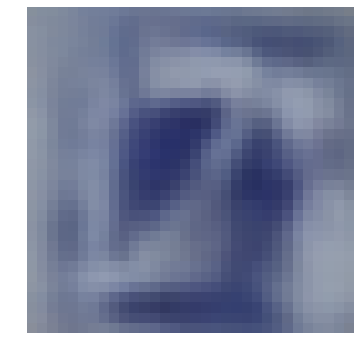

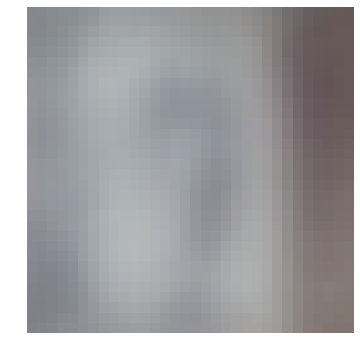

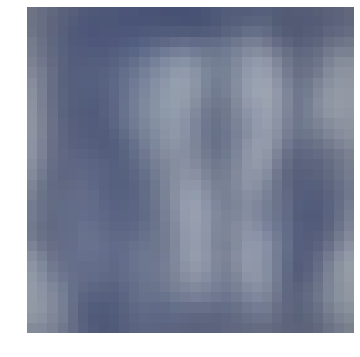

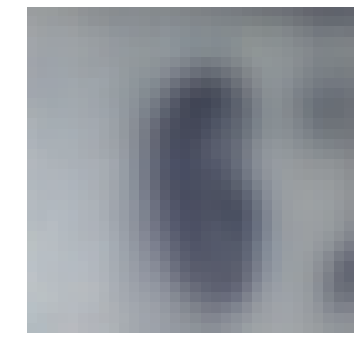

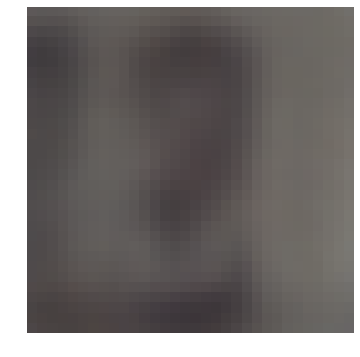

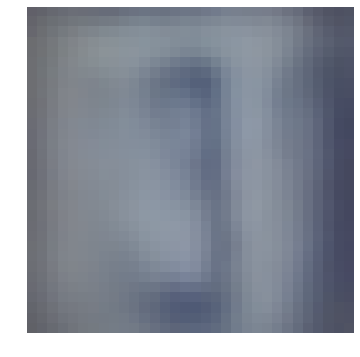

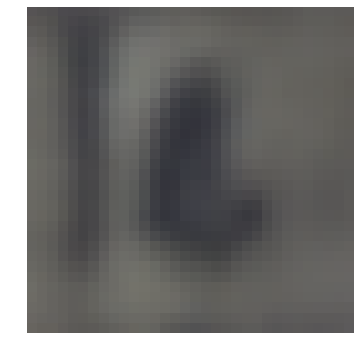

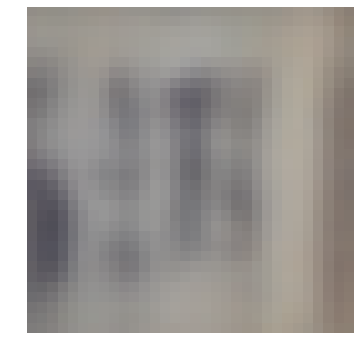

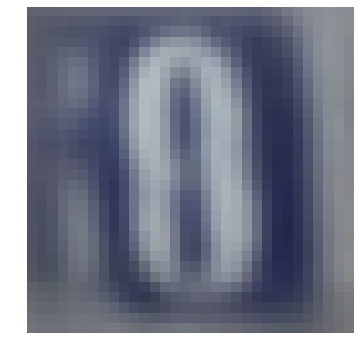

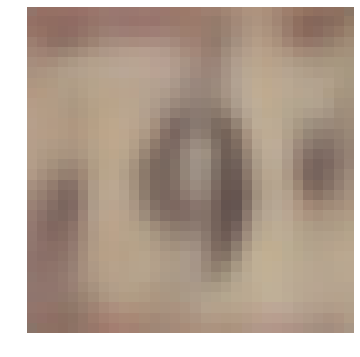

In [0]:
generation_helper.random_samples(10, display_frequency = 1)

torch.Size([11, 100])


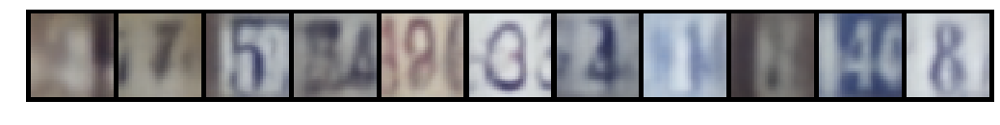

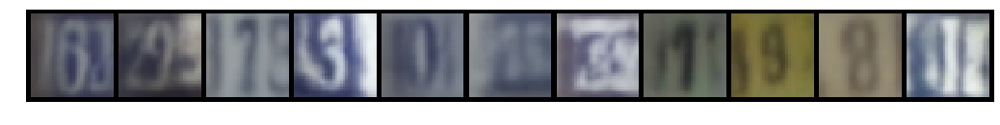

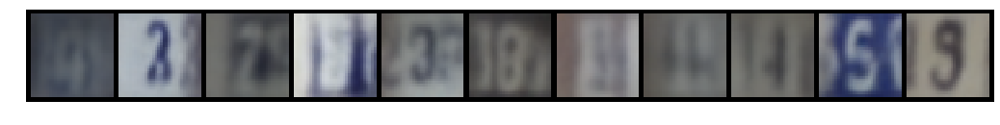

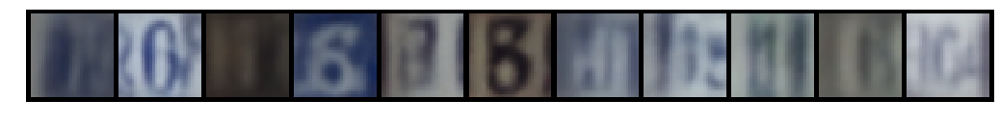

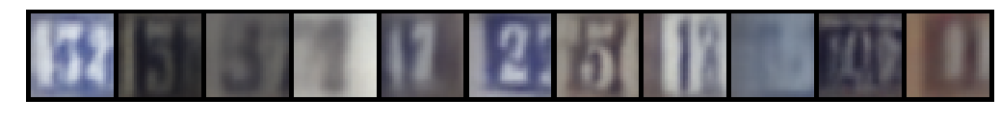

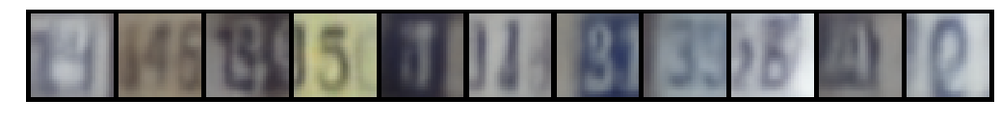

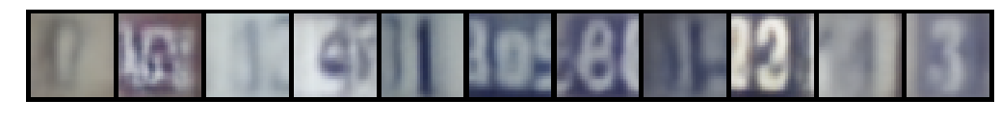

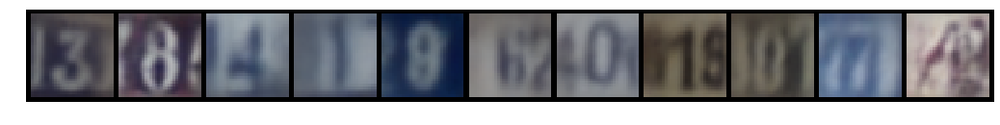

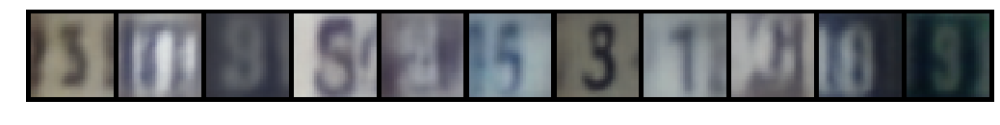

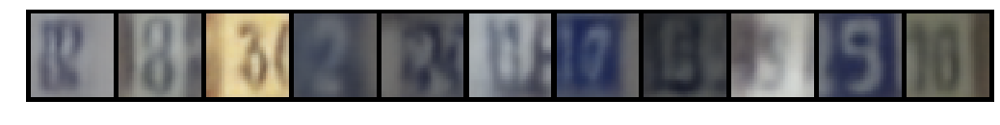

In [0]:
generation_helper.random_samples(10, batch_size = 11, display_frequency = 1)

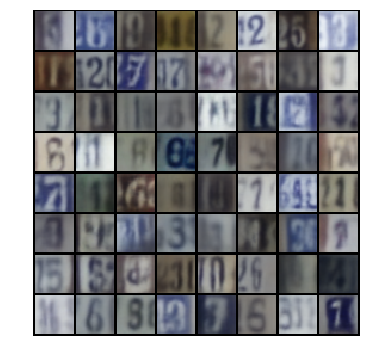

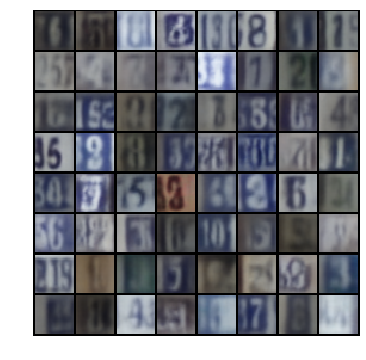

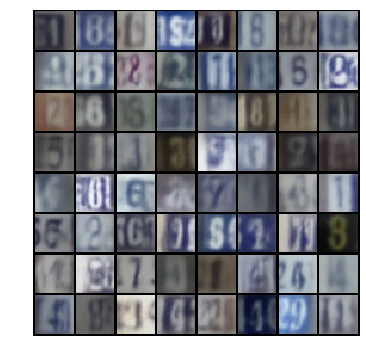

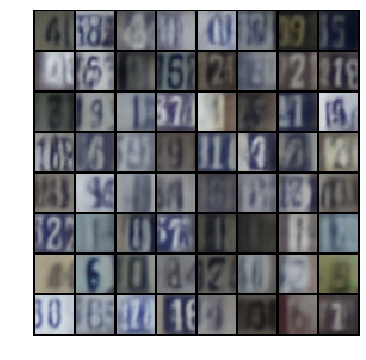

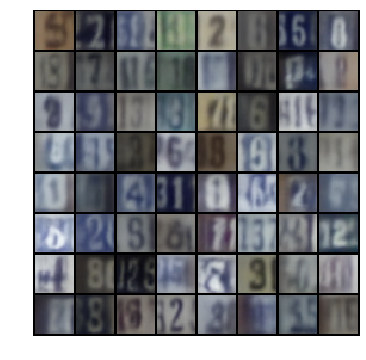

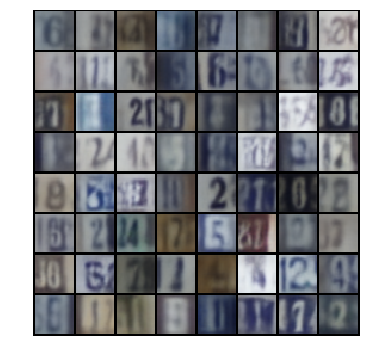

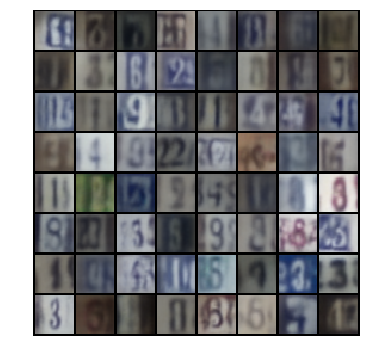

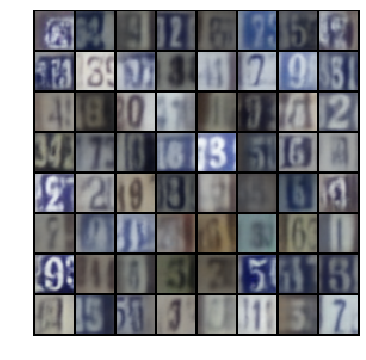

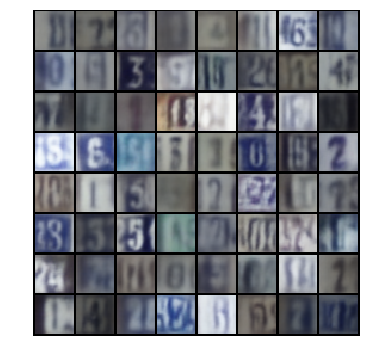

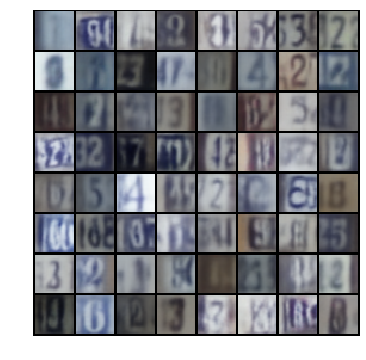

In [0]:
generation_helper.random_samples(10, 64)

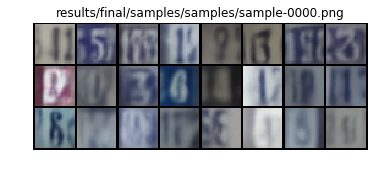

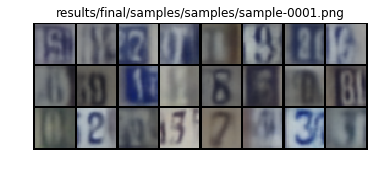

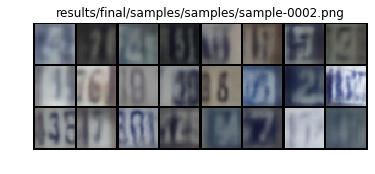

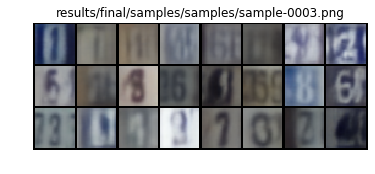

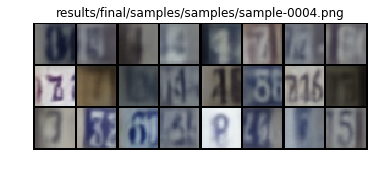

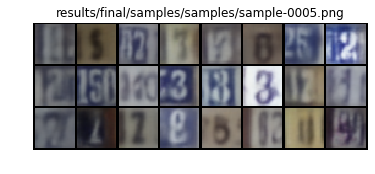

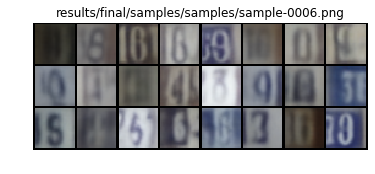

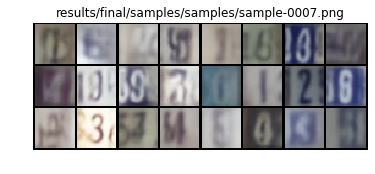

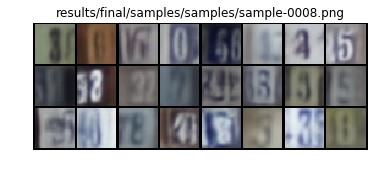

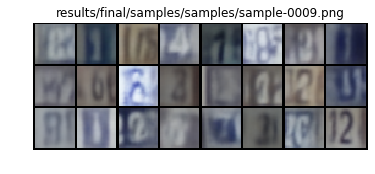

In [0]:
generation_helper.random_samples(10, 24)


results/final/samples/sample-0000.png

results/final/samples/sample-0001.png

results/final/samples/sample-0002.png

results/final/samples/sample-0003.png

results/final/samples/sample-0004.png

results/final/samples/sample-0005.png

results/final/samples/sample-0006.png

results/final/samples/sample-0007.png

results/final/samples/sample-0008.png

results/final/samples/sample-0009.png


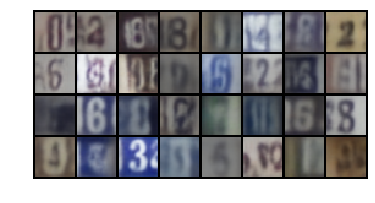

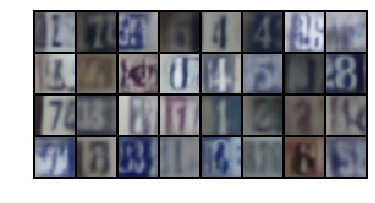

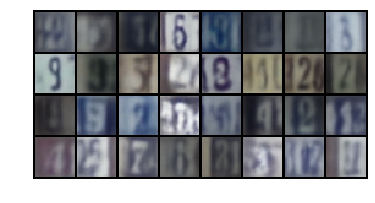

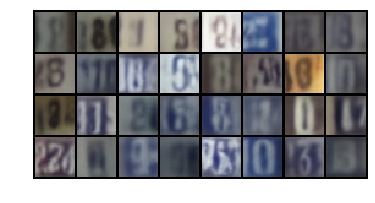

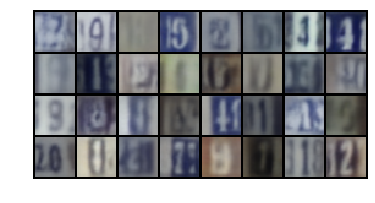

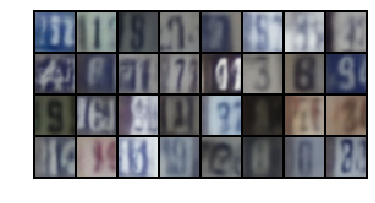

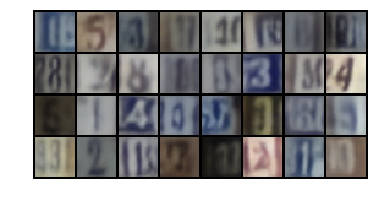

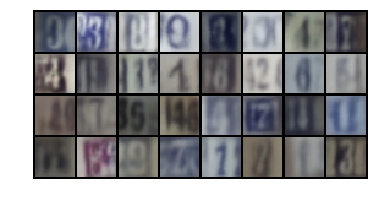

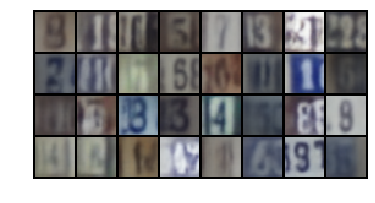

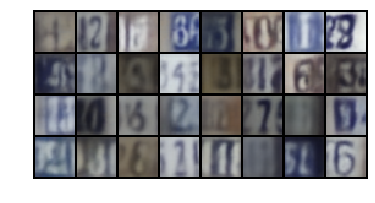

In [0]:
x = generate_samples(10, model, 'final', 32)

## Perturbed Samples

False


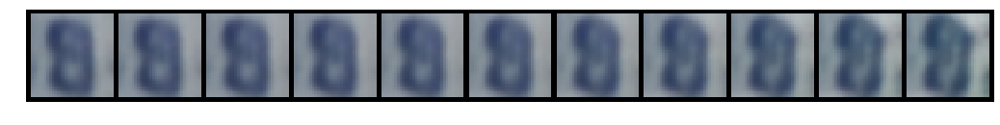

In [0]:
generation_helper.perturbed_samples(5, 5)

False


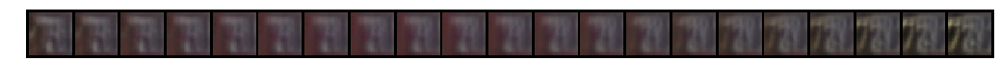

In [0]:
generation_helper.perturbed_samples(10, 90)

False


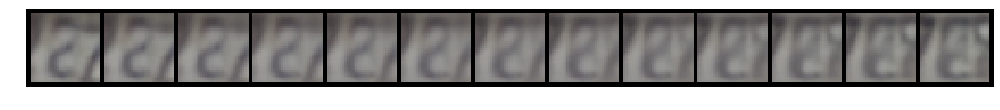

In [0]:
generation_helper.perturbed_samples(6, 85)

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


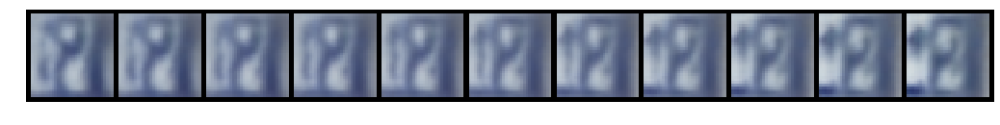

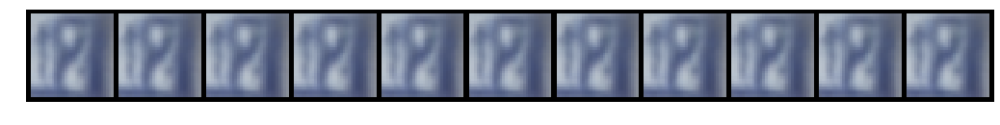

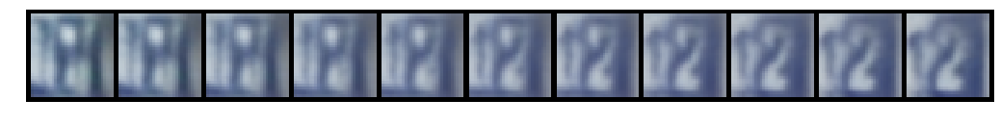

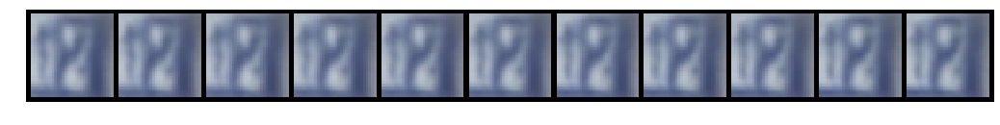

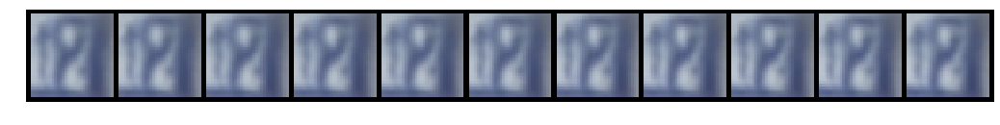

...

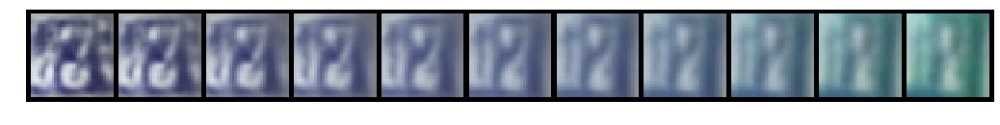

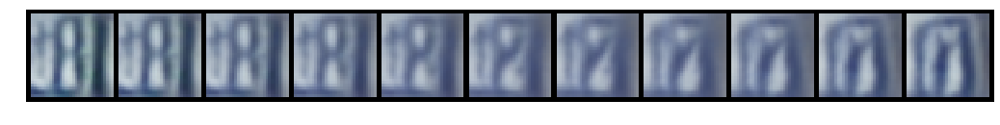

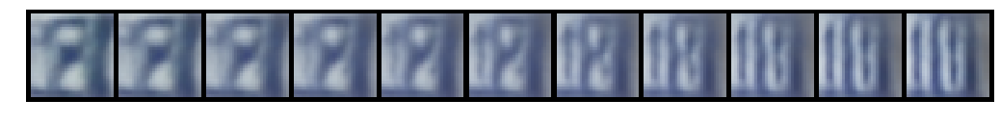

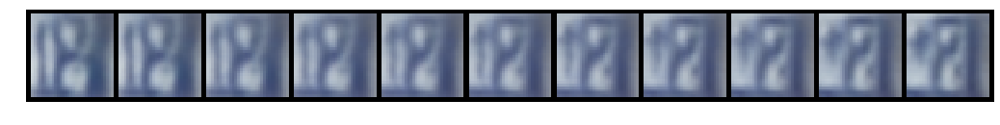

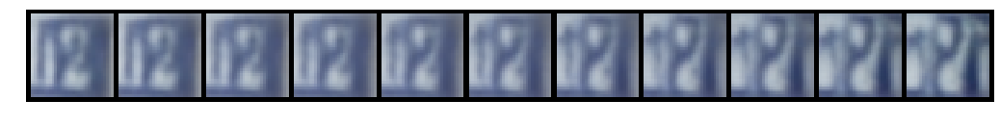

In [0]:
generation_helper.perturbed_samples(5)

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


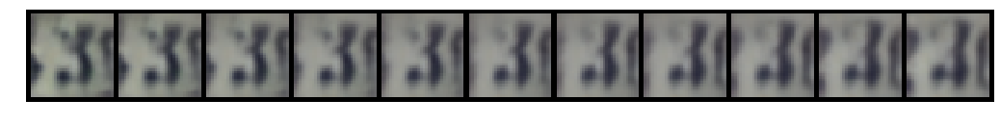

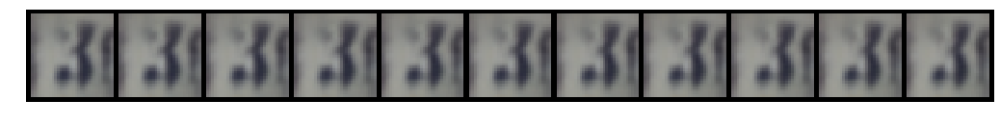

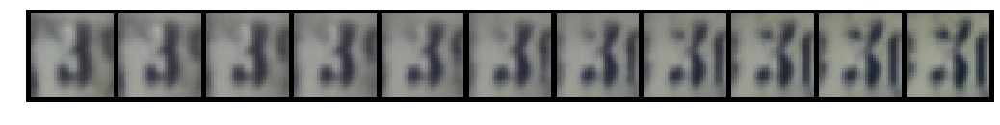

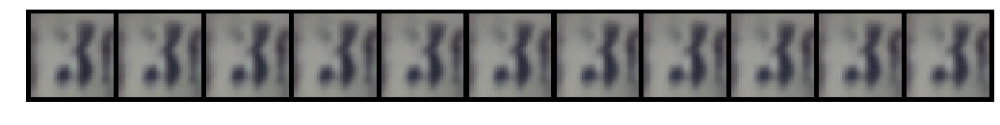

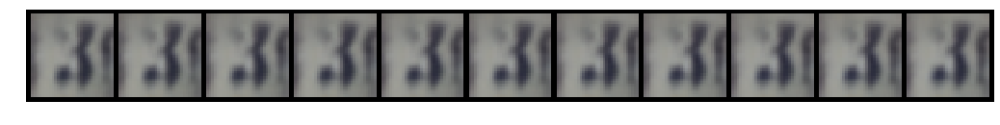

...

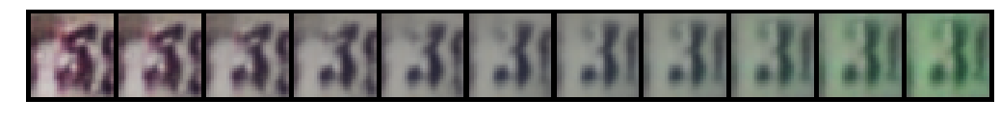

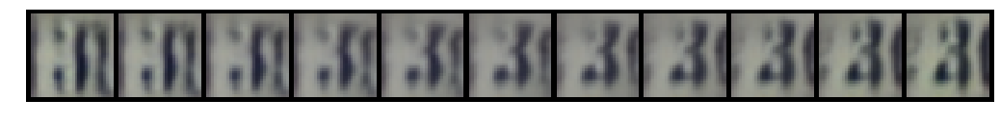

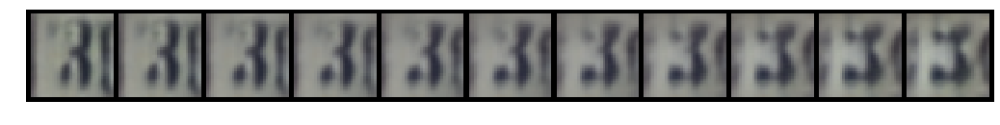

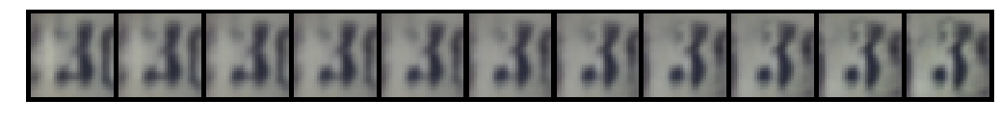

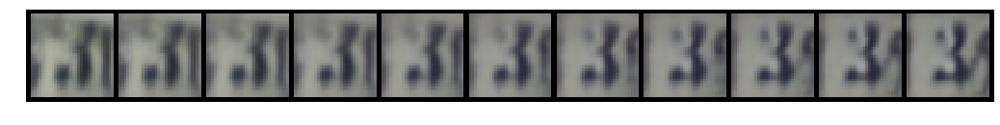

In [0]:
generation_helper.perturbed_samples(5)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False


/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False


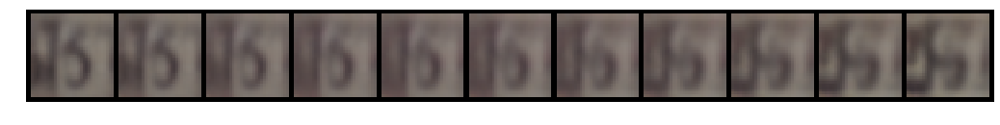

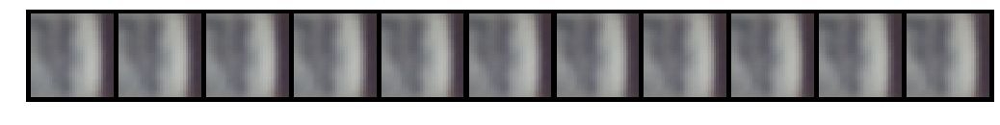

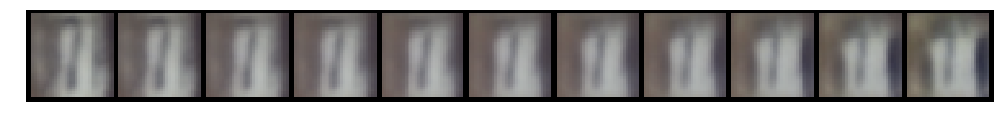

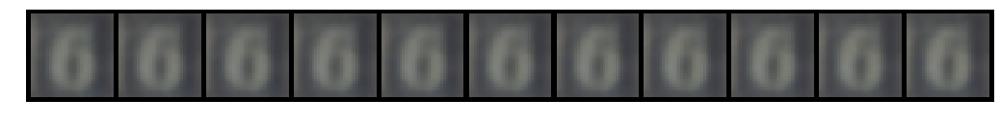

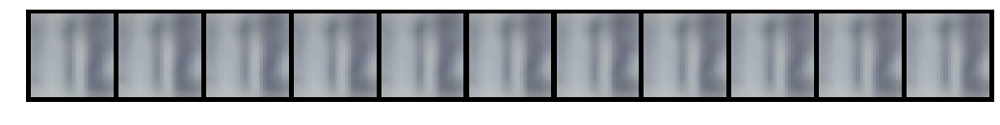

...

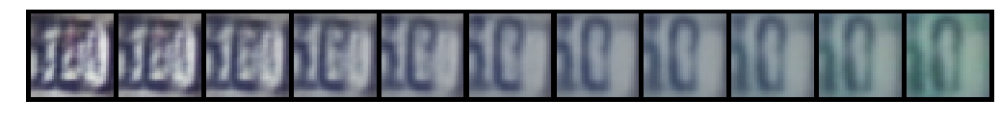

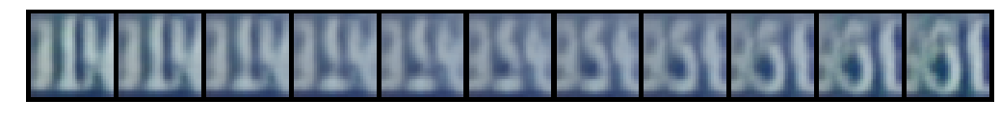

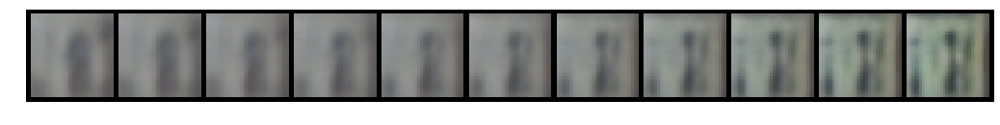

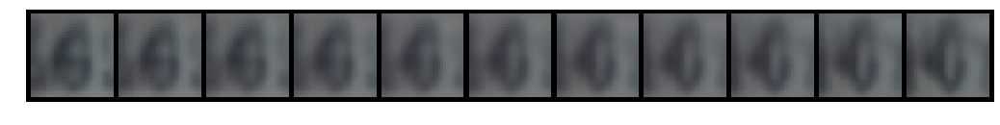

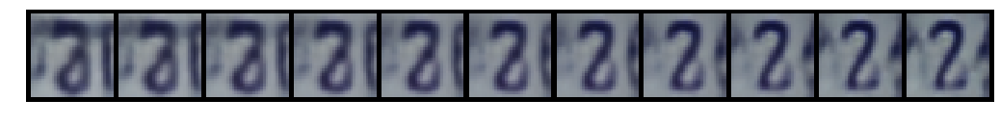

In [0]:
for dim in range(LATENT_DIMENSION):
  generation_helper.perturbed_samples(5, dim)

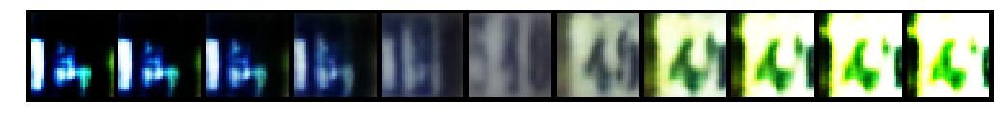

In [0]:
generation_helper.perturbed_samples(5, 'all')

## Latent Interpolation

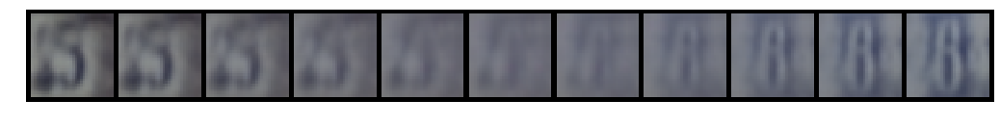

In [0]:
generation_helper.latent_interpolated_samples()

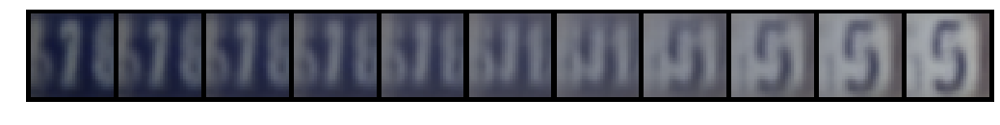

In [0]:
vae_helper.latent_interpolated_samples()

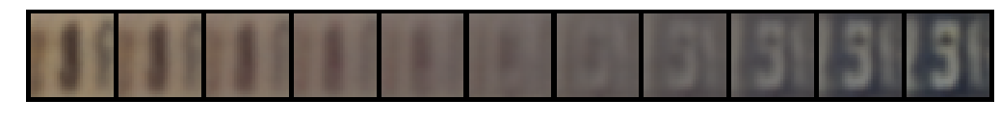

In [0]:
vae_helper.latent_interpolated_samples()

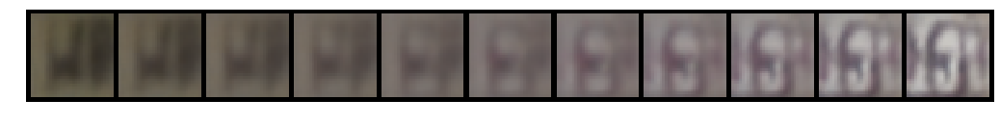

In [0]:
vae_helper.latent_interpolated_samples()

torch.Size([1, 11, 100])
torch.Size([11, 100])


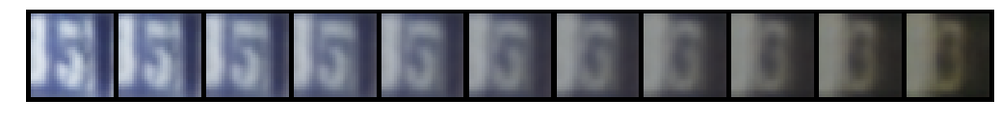

In [0]:
generation_helper.latent_interpolated_samples()

torch.Size([1, 11, 100])
torch.Size([11, 100])


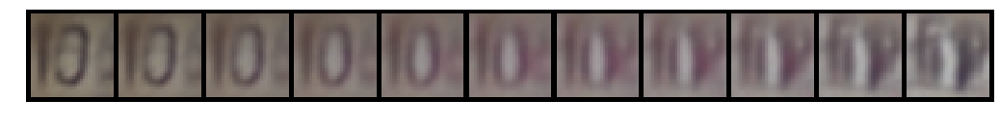

In [0]:
generation_helper.latent_interpolated_samples()

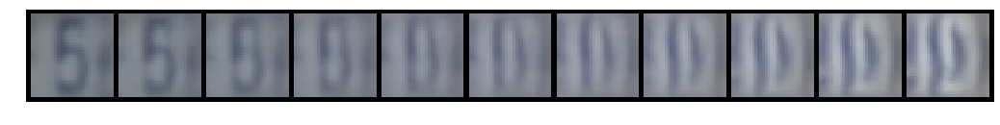

In [0]:
vae_helper.latent_interpolated_samples()

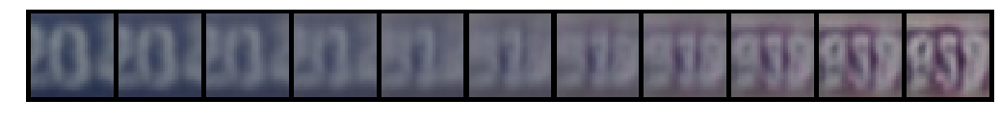

In [0]:
vae_helper.latent_interpolated_samples()

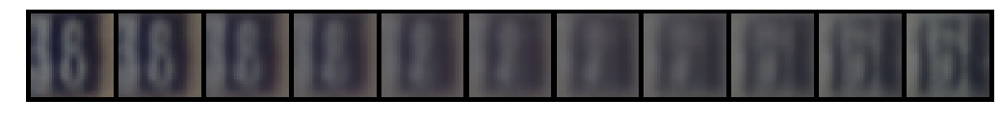

In [0]:
vae_helper.latent_interpolated_samples()

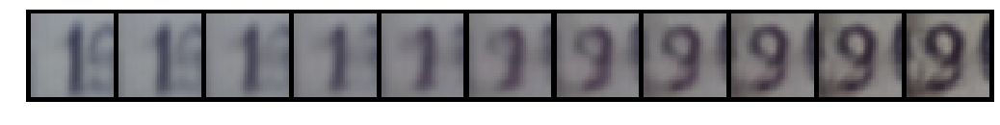

In [0]:
vae_helper.latent_interpolated_samples()

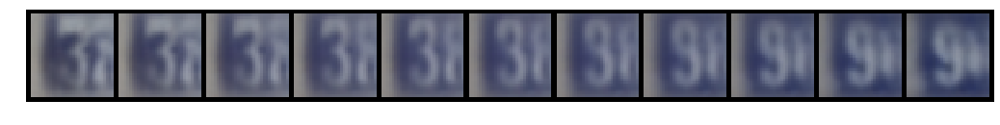

In [0]:
vae_helper.latent_interpolated_samples()

## Data Interpolation

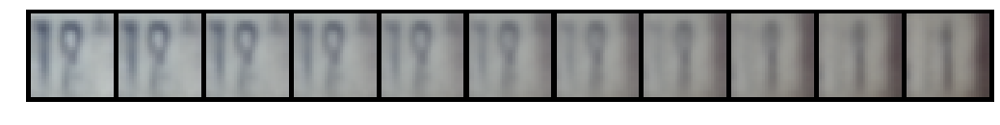

In [0]:
generation_helper.data_interpolated_samples()

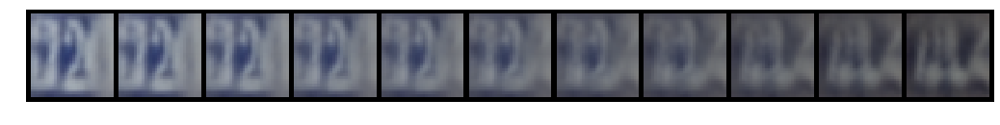

In [0]:
generation_helper.data_interpolated_samples()

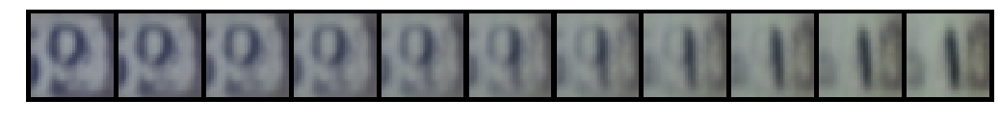

In [0]:
generation_helper.data_interpolated_samples()

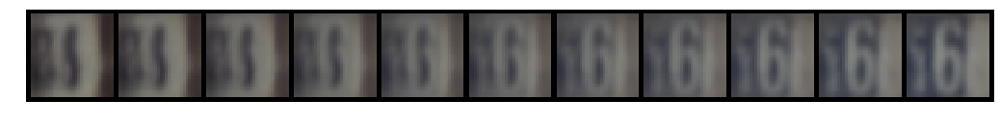

In [0]:
generation_helper.data_interpolated_samples()

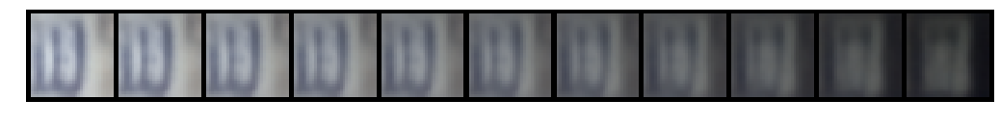

In [0]:
generation_helper.data_interpolated_samples()

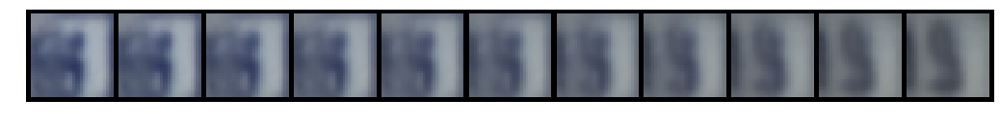

In [0]:
generation_helper.data_interpolated_samples()

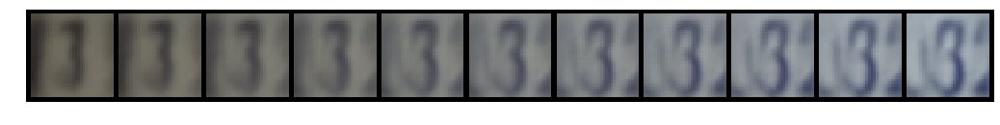

In [0]:
vae_helper.data_interpolated_samples()

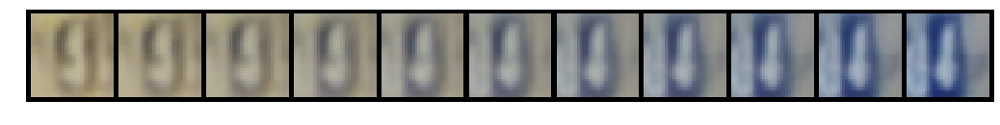

In [0]:
vae_helper.data_interpolated_samples()

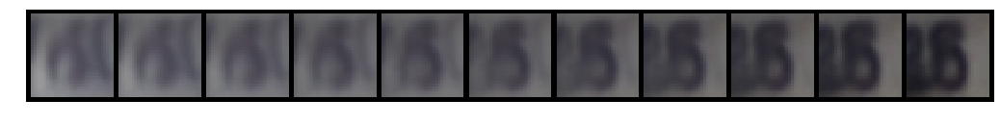

In [0]:
vae_helper.data_interpolated_samples()

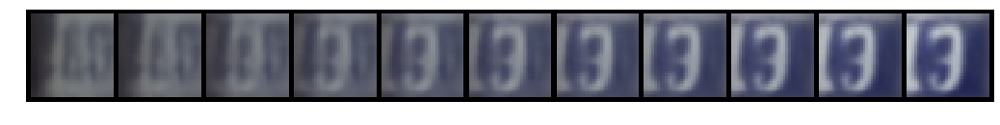

In [0]:
vae_helper.data_interpolated_samples()

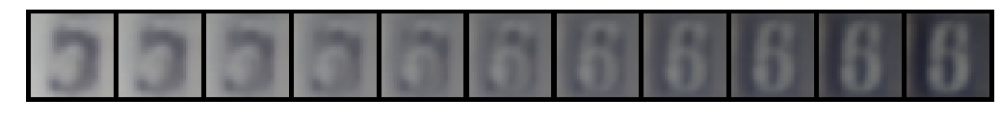

In [0]:
vae_helper.data_interpolated_samples()

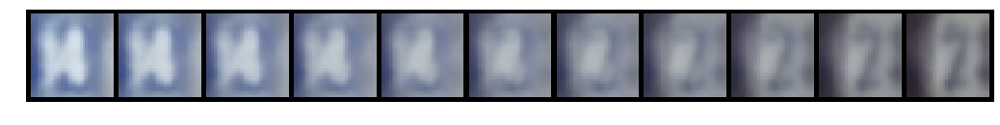

In [0]:
vae_helper.data_interpolated_samples()

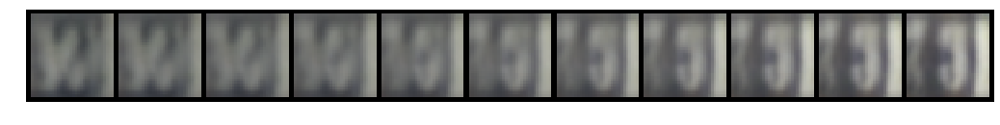

In [0]:
vae_helper.data_interpolated_samples()

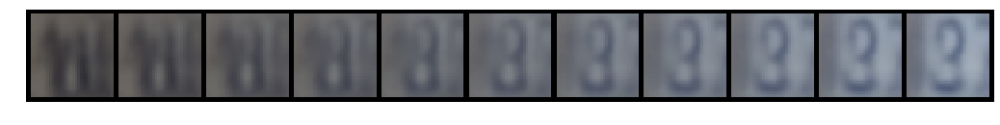

In [0]:
vae_helper.data_interpolated_samples()

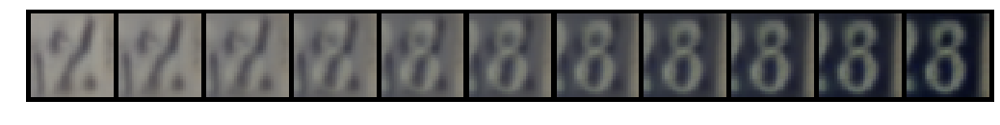

In [0]:
vae_helper.data_interpolated_samples()

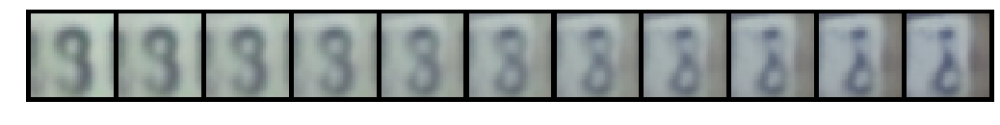

In [0]:
vae_helper.data_interpolated_samples()

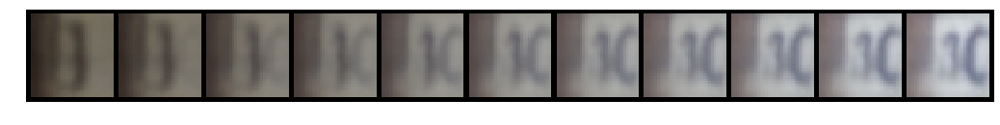

In [0]:
vae_helper.data_interpolated_samples()

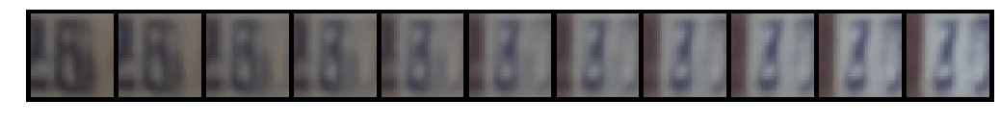

In [0]:
vae_helper.data_interpolated_samples()

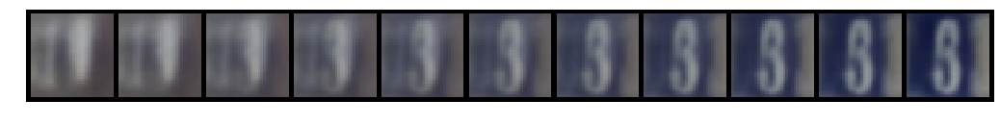

In [0]:
vae_helper.data_interpolated_samples()

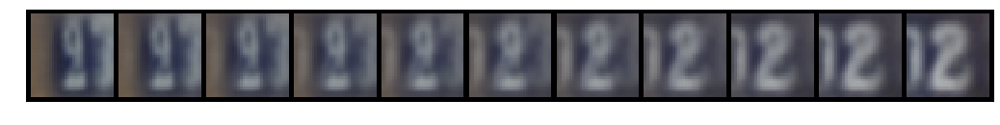

In [0]:
vae_helper.data_interpolated_samples()

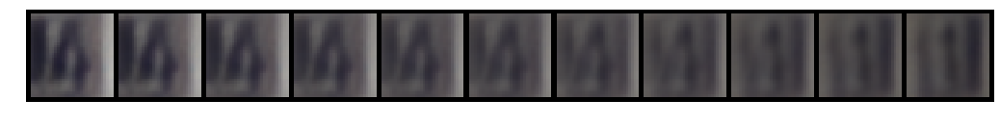

In [0]:
vae_helper.data_interpolated_samples()